# **Исследование рынка общественного питания Москвы**

<div class="alert alert-block alert-info">
    
**Презентация: https://disk.yandex.ru/i/6IINQ2PG2jgCNA**

</div>

Описание ситуации:

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. 

**Ваша задача:**

- **подготовить исследование рынка общепита Москвы;**
- **найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.**

**Для более быстрого погружения в ситуацию предоставляю описание данных:**

Вам доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. 

Описание данных

Файл ***/datasets/moscow_places.csv***:

- name — название заведения;
address — адрес заведения;
- category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- hours — информация о днях и часах работы;
- lat — широта географической точки, в которой находится заведение;
- lng — долгота географической точки, в которой находится заведение;
- rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например: 
«Средний счёт: 1000–1500 ₽»;
«Цена чашки капучино: 130–220 ₽»;
«Цена бокала пива: 400–600 ₽».
и так далее;
- middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»: 

Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.

- middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»: 

Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.

- chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
0 — заведение не является сетевым
1 — заведение является сетевым
- district — административный район, в котором находится заведение, например Центральный административный округ;
- seats — количество посадочных мест.

In [1]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import plotly.subplots as sp
import seaborn as sns
import matplotlib.pyplot as plt
import folium as fm
from folium import Map, Choropleth
from folium import Marker
from folium.plugins import MarkerCluster
import json

# импортируем библиотеки

## **Шаг 1. Загрузка данных и изучение общей информации**

In [2]:
df = pd.read_csv('https://code.s3.yandex.net/datasets/moscow_places.csv')
df.head()
# выводим первые 5 строк

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


Поскольку для некоторых столбцов дефолтной ширины недостаточно, то изменим этот параметр, чтобы было видно всю информацию при выводе 

In [3]:
pd.set_option('display.max_colwidth', 200)

In [4]:
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [5]:
df.info()
# выводим основную информацию

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


В данных есть пропуски, однако пропуски во всех столбцах, кроме "middle_coffee_cup", объясняются тем, что у нас просто отсутвует детальная информация о конкретном заведении. Возможны следующие причины: 

- на сайте заведения отсутвует та или иная информация;
- данные были потерены при обрабортке;
- имеющиеся данные не подходят под условия актуальности (слишком давно не обновлялись) и др. причины

В случае с "middle_coffee_cup" все еще проще - каждое заведение в данном дф является кофейней, поэтому не у всех заведений в столбце "avg_bill" указана «Цена одной чашки капучино» - вследствие чего у нас и появились пропуски в столбце "middle_coffee_cup". 

**Далее мы изучим количество заведений каждой категории в нашем датасете.**

In [6]:
df.groupby('category', as_index=False) \
  .agg({'name': 'count'}) \
  .rename(columns={'name': 'amount'}) \
  .sort_values(by='amount', ascending=False)
# выводим список наиболее популярных категорий заведений  

,category,amount
3,кафе,2378
6,ресторан,2043
4,кофейня,1413
0,"бар,паб",765
5,пиццерия,633
2,быстрое питание,603
7,столовая,315
1,булочная,256


**В нашем датасете больше всего заведений категории "кафе" - 2378, ресторанов - 2043, а кофейн - 1413.**

## **Шаг 2. Предобработка данных**

In [7]:
coffe_shop = df[df['middle_coffee_cup'].notnull()]
coffe_shop.value_counts('category')
# создадим переменную с кофейнями, чтобы проверить данные на наличие дефектов
# поскольку в описнаие данных сказано, что в столбце "middle_coffee_cup" должно быть значение только у кофейнь

category
кофейня            521
бар,паб              6
кафе                 4
пиццерия             3
быстрое питание      1
dtype: int64

У нас **14 заведений**, категория которых не соответствует "кофейни", хотя информация о цене одной чашки капучино есть, посмтрим на эти заведения

In [8]:
df[(df['middle_coffee_cup'].notnull()) & (df['category'] != 'кофейня')]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
539,French Bakery,кафе,"Москва, проезд Стратонавтов, 7, корп. 2",Северо-Западный административный округ,пн-пт 07:30–23:00; сб 08:00–22:00; вс 09:00–21:00,55.826695,37.437705,4.1,NaN,Цена чашки капучино:75 ₽,NaN,75.0,1,8.0
1183,Сладкая параллель,пиццерия,"Москва, Таллинская улица, 26",Северо-Западный административный округ,"пн-пт 08:00–21:00; сб,вс 09:00–21:00",55.799267,37.407718,4.4,средние,Цена чашки капучино:130–170 ₽,NaN,150.0,0,0.0
1581,French Bakery,кафе,"Москва, улица Куусинена, 1",Северный административный округ,пн-пт 07:30–23:00; сб 08:00–22:00; вс 09:00–21:00,55.778303,37.516466,3.5,NaN,Цена чашки капучино:75–150 ₽,NaN,112.0,1,30.0
3078,Кофеварка,"бар,паб","Москва, Крылатская улица, 31к2",Западный административный округ,"пн-пт 09:00–21:00; сб,вс 10:00–21:00",55.770008,37.409037,4.2,средние,Цена чашки капучино:150–200 ₽,NaN,175.0,0,NaN
3204,Органик,пиццерия,"Москва, Карамышевская набережная, 34",Северо-Западный административный округ,"ежедневно, 10:00–22:30",55.769098,37.472316,4.3,выше среднего,Цена чашки капучино:100–200 ₽,NaN,150.0,0,0.0
3554,Bo-bo Lounge,"бар,паб","Москва, Большая Садовая улица, 5, корп. 1",Центральный административный округ,"ежедневно, 15:00–05:00",55.768362,37.592630,4.6,высокие,Цена чашки капучино:от 250 ₽,NaN,250.0,0,98.0
3593,Румбокс,"бар,паб","Москва, Новинский бульвар, 22",Центральный административный округ,"ежедневно, 07:30–22:00",55.756698,37.584777,4.3,средние,Цена чашки капучино:180–210 ₽,NaN,195.0,0,NaN
4127,Fine coffee bar,"бар,паб","Москва, улица Волхонка, 9, стр. 2",Центральный административный округ,"пн-пт 09:00–23:00; сб,вс 10:00–23:00",55.747145,37.607987,4.4,средние,Цена чашки капучино:250 ₽,NaN,250.0,0,NaN
4848,Coffeebara,"бар,паб","Москва, Таганская улица, 32/1с1",Центральный административный округ,"пн-пт 08:00–21:00; сб,вс 10:00–20:00",55.739432,37.665045,4.3,средние,Цена чашки капучино:130–210 ₽,NaN,170.0,0,NaN
6329,Филин,"бар,паб","Москва, Автозаводская улица, 13/1",Южный административный округ,"пн-пт 09:00–23:00; сб,вс 10:00–22:00",55.705543,37.655954,4.3,средние,Цена чашки капучино:170–250 ₽,NaN,210.0,1,15.0


Поскольку большинство заведений из вывода выше действительно являются кофейнями, необходимо заменить их категорию на соответствующую. Данная ошибка в данных могла появиться по следующим причинам:



* неверно указанная категория владельцами заведения;
* некачественно спарсированные данные;
* и другие примеры технологических и человеческих факторов. 

**Далее мы займемся изменением категории данных заведений**

In [9]:
df.loc[(df['middle_coffee_cup'].notnull()) & (df['category'] != 'кофейня'), 'category'] = 'кофейня'
# изменим категорию заведений на соответствующие 
df[(df['middle_coffee_cup'].notnull()) & (df['category'] != 'кофейня')]
# проверим, что все сделали правильно

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats


In [10]:
df['name'] = df['name'].str.lower()
df['name'] = df['name'].str.replace('ё', 'е')
# приведем названия заведений к нижнему регистру и заменим все буквы "ё" на "е", во избежание пропуска дубликатов 
df.duplicated().sum()
# выводим количество явных дубликатов

0

In [11]:
df[df.duplicated(['name', 'address'])]
# посмотрим, есть ли у нас дубликаты заведений с одинаковым названием и адресом

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1511,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00–18:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
2420,раковарня клешни и хвосты,"бар,паб","Москва, проспект Мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00–00:00",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0
3109,хлеб да выпечка,кафе,"Москва, Ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0


Всего 3 таких заведения, изучим каждый случай отдельно, чтобы удалить наиболее неподходящий вариант

In [12]:
df[(df['name'] == 'more poke') & (df['address'] == 'Москва, Волоколамское шоссе, 11, стр. 2')]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1430,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,0,188.0
1511,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00–18:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0


В данном случае я считаю, что стоит оставить вторую запись, поскольку в ней более детализированные данные - часы работы и указание на сетевой формат заведения

Проверим, есть ли в нашем датасете еще записи с таким же названием заведения, чтобы убедиться, что это точно сеть ресторанов

Хоть стоит заметить, что даже если в нашем дф будет всего 2 записи (дубликаты), то это не означает, что данное заведение точно не сетевое, ведь в нашем датасете собраны данные не по всем заведениям Москвы. 
"Вам доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер." – что подтверждает выше выдвинутую гипотезу

In [13]:
df[df['name'] == 'more poke']

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1430,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,0,188.0
1511,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00–18:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
6088,more poke,ресторан,"Москва, Духовской переулок, 19",Южный административный округ,"ежедневно, 10:00–22:00",55.704177,37.612889,4.4,NaN,NaN,NaN,NaN,1,NaN


Все-таки сеть, а значит удаляем строку с индексом 1430

In [14]:
df = df.drop(index = 1430)

In [15]:
df[(df['name'] == 'раковарня клешни и хвосты') & (df['address'] == 'Москва, проспект Мира, 118')]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
2211,раковарня клешни и хвосты,ресторан,"Москва, проспект Мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.810553,37.638161,4.4,NaN,NaN,NaN,NaN,0,150.0
2420,раковарня клешни и хвосты,"бар,паб","Москва, проспект Мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00–00:00",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0


In [16]:
df[df['name'] == 'раковарня клешни и хвосты']

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
2211,раковарня клешни и хвосты,ресторан,"Москва, проспект Мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.810553,37.638161,4.4,NaN,NaN,NaN,NaN,0,150.0
2420,раковарня клешни и хвосты,"бар,паб","Москва, проспект Мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00–00:00",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0
7270,раковарня клешни и хвосты,"бар,паб","Москва, Братиславская улица, 12",Юго-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00–00:00",55.659744,37.752984,4.9,средние,Цена бокала пива:150–250 ₽,NaN,NaN,1,40.0


Ситуация анлогичная, удаляем строку с индексом 2211
Тем более, у первой строки в дф категория – "ресторан", а у остальных записей - "бар, паб"

In [17]:
df = df.drop(index = 2211)

In [18]:
df[(df['name'] == 'хлеб да выпечка') & (df['address'] == 'Москва, Ярцевская улица, 19')]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
3091,хлеб да выпечка,булочная,"Москва, Ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.738886,37.411648,4.1,NaN,NaN,NaN,NaN,1,276.0
3109,хлеб да выпечка,кафе,"Москва, Ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0


In [19]:
df[df['name'] == 'хлеб да выпечка']

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
3091,хлеб да выпечка,булочная,"Москва, Ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.738886,37.411648,4.1,NaN,NaN,NaN,NaN,1,276.0
3109,хлеб да выпечка,кафе,"Москва, Ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0
7937,хлеб да выпечка,кофейня,"Москва, Каширское шоссе, 61Г",Южный административный округ,"ежедневно, 09:00–22:00",55.621379,37.714108,4.5,NaN,NaN,NaN,NaN,1,NaN


Опять же удаляем строку, где указано, что это не сетевое заведение - 3109 - хотя даже по нашему дф - это сеть (более 1 адреса заведения)
Только придется еще заменить категорию заведения в строке 7937, поскольку и по названию, и отсутвию данных характерных для кофейни - скорее всего, это заведение действительно булочная 

In [20]:
df = df.drop(index = 3109)
df.loc[7937, 'category'] = 'булочная'

На этом мы заканчиваем этап работы с пропусками и дубликатами, поскольку если так детально изучать каждую сеть заведений, то можно закопаться в данный на процесс на многие часы, что нам не нужно

**Следующим шагом в предобработке данных будет создание столбцов: "street" и "is_24/7"**

In [21]:
df['street'] = df['address'].apply(lambda x: x.split(', ', 2)[1])
df.head()
# создаем столбец с названием улицы заведения и выводим полученный результат

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица


In [22]:
df['is_24/7'] = df['hours'].apply(lambda x: True if str(x).split(', ', 1)[0] == 'ежедневно' and str(x).split(', ', 1)[1] == 'круглосуточно' else False)
df.head()
# создаем столбец с информацией, круглосуточное заведение или нет

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False


In [23]:
df.groupby('category', as_index=False) \
  .agg({'name': 'count'}) \
  .rename(columns={'name': 'amount'}) \
  .sort_values(by='amount', ascending=False)
# выводим список наиболее популярных категорий заведений после предобработки

,category,amount
3,кафе,2373
6,ресторан,2041
4,кофейня,1426
0,"бар,паб",759
5,пиццерия,630
2,быстрое питание,602
7,столовая,315
1,булочная,257


**В нашем дф 1426 кофейн из 8406 заведений – больше только рестаранов – 2041 – и кафе – 2375**

**На этом этап предобработки данных завершается**

**Итоги предобработки данных:**



1. явные дубликаты отсутствуют;
1. неявные дубликаты - заведения с одинаковым названием и адресом - удалены;
1. все кофейни имеют соответсвующую категорию заведения; 
1. продемонстрирован вариант детальной обработки данных;
1. добавлены 2 новых столбца - "street" с указанием улицы заведения и "is_24/7" с информацием о том, работает ли место круглосуточно









## **Шаг 3. Анализ данных**

In [24]:
df_grpd = df.groupby('category', as_index=False) \
  .agg({'name': 'count'}) \
  .rename(columns={'name': 'amount'}) \
  .sort_values(by='amount') \
  .reset_index(drop=True)
# создадим отдельный датасет с информацией о количестве заведений каждой категории

In [25]:
fig = px.bar(df_grpd, x='category', y='amount', color='category', color_discrete_sequence=px.colors.qualitative.Pastel2, text='amount')
fig.update_layout(title='Количество заведений общественного питания по категориям', 
                  xaxis_title='категория заведений', yaxis_title='кол-во заведений', 
                  legend_title='название категории',
                  showlegend=True)
fig.update_traces(marker_line_color='black', marker_line_width=1)
fig.update_traces(textposition='inside')
fig.show()
# Строим график 

По графику выше видно: 

- заведений категории "кафе" больше всего - 2373, на втором месте – "рестораны" - их 2041, а кофейнь - 1426. 

Можно предположить, что топ-3 популярных категорий заведений общепита выглядит именно таким образом, поскольку данные типы заведений наиболее выгодны с точки зрения отношения сложности открытия к потенциальной получаемой прибыли - то есть в Москве большинство людей предпочитает сходить в кафе булочным, в ресторан барам, а кофейни популярнее, чем заведения фаст фуда.

In [26]:
df_grpd = df.groupby('category', as_index=False) \
  .agg({'seats': 'median'}) \
  .rename(columns={'seats': 'amount_of_seats'}) \
  .sort_values(by='amount_of_seats') \
  .reset_index(drop=True)
# перезапишем дф, создадим переменную с информацией о медианном количестве мест по каждой категории

In [27]:
fig = px.bar(df_grpd, x='category', y='amount_of_seats', color='category', color_discrete_sequence=px.colors.qualitative.Pastel2, text='amount_of_seats')
fig.update_layout(title='Медианное количество посадочных мест по категориям', 
                  xaxis_title='категория', yaxis_title='кол-во посадочных мест', 
                  legend_title='название категории',
                  showlegend=True)
fig.update_traces(marker_line_color='black', marker_line_width=1)
fig.update_traces(textposition='inside')
fig.show()
# строим график 

По графику выше видно: 

- наименьшее количество мест - в булочных, медианное значение равно 50, а наибольшее - в ресторанах - 86.

В целом, кажется что подозрительное большое количество мест в кофйенях - так как медианное значение в ресторанах лишь на 6 больше, поэтому давайте посмотрим распределение количества мест по каждой категории с помощью боксплотов - ящиков с усами.

In [28]:
fig = px.box(df, x="category", y="seats", points='outliers', color='category', color_discrete_sequence=px.colors.qualitative.Antique)
fig.update_layout(title='Распределение количества посадочных мест по категориям', 
                  xaxis_title='категория', yaxis_title='кол-во посадочных мест', 
                  legend_title='название категории',
                  showlegend=True)
fig.show()
# строим график 

По графику выше видно:

- что в кофейнях, упомянутых выше, большинство выбросов находятся в диапозоне от 144 - Q3 - до 500, но как ни странно ситуация с рестораннами почти такая же, разве что Q3 побольше немного - 150;
- в булочных самый большой выброс - 625, в то время как почти во всех остальных категориях есть выдающиеся с 1200 посадочных мест 

In [29]:
df_grpd = df.groupby('chain', as_index=False) \
  .agg({'chain': 'count'}) \
  .rename(columns={'chain': 'amount'}) \
  .sort_values(['amount'])
# перезапишем дф, создадим переменную с информацией о количестве распределении заведений в датасете по сетевому признаку

In [30]:
fig = go.Figure(data=[go.Pie(labels=['сетевые заведения', 'не сетевые заведения'], values=df_grpd['amount'], pull=[0.2, 0])])
fig.update_layout(title='Распределение заведений: "сетевые" vs. "не сетевые"') 
fig.update_traces(marker=dict(colors=px.colors.qualitative.Antique))
fig.show()
# строим круговую диаграмму

Не сетевые заведния преобладают в датасете - их 61,9% или же 5198, а сетевых лишь 38,1% или же 3205

Далее мы посмотрим как распределены сетевые заведения в каждой из категорий

In [31]:
df_grpd = df.groupby(['chain', 'category'], as_index=False) \
  .agg({'name': 'count'}) \
  .rename(columns={'name': 'amount'}) \
  .sort_values(['amount'])
df_grpd['chain'] = df_grpd['chain'].map({0: 'Не сеть', 1: 'Сеть'})
# перезапишем дф, создадим переменную с информацией о количестве распределении заведений 
# в датасете по сетевому признаку по каждой категории
# а также поменяем значения в столбце "chain" для построения более читаемого графика

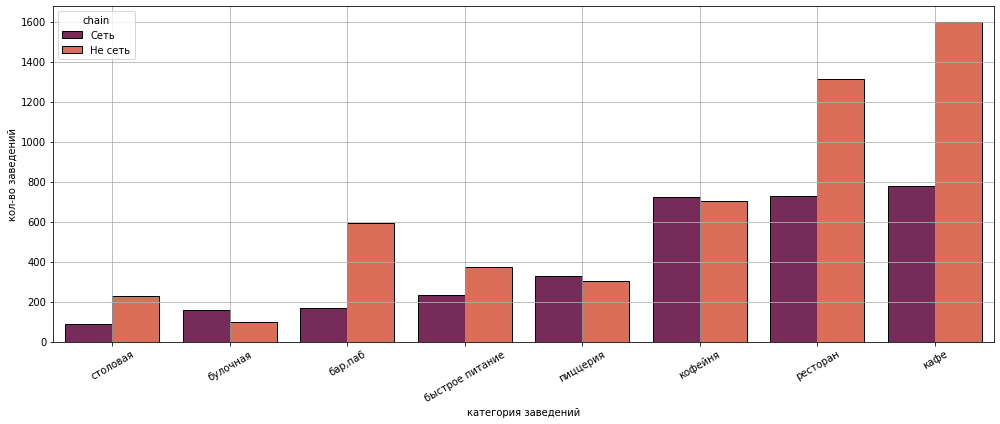

In [32]:
fig, ax = plt.subplots(figsize=(14, 6))

sns.barplot(data=df_grpd, x="category", y="amount", hue="chain", edgecolor='black', ax=ax, palette='rocket')
ax.set_xticklabels(ax.get_xticklabels(), rotation=30)
ax.set_xlabel('категория заведений')
ax.set_ylabel('кол-во заведений')
fig.tight_layout()
plt.grid(True)
plt.show()
# строим столбчатую диаграмму

Несмотря на то, что данный график отображает распредление заведений по сетевому признаку внутри каждой категории,  данный способ визуализации не самый удачный, поэтому далее мы подготовим данные и построим для каждой категории свою диаграмму.

In [33]:
non_chains_per_cat = df.query('chain == 0').groupby('category', as_index=False) \
  .agg({'name': 'count'}) \
  .rename(columns={'name': 'non_chains_am'}) \
  .sort_values(['non_chains_am'])
# создадим дф с информацией о кол-ве не сетевых заведений по категориям

chains_per_cat = df.query('chain == 1').groupby('category', as_index=False) \
.agg({'name': 'count'}) \
.rename(columns={'category': 'cat','name': 'chains_am'}) \
.sort_values(['chains_am'])
# создадим дф с информацией о кол-ве сетевых заведений по категориям

chains_df = pd.concat([non_chains_per_cat, chains_per_cat], axis=1).drop('cat', axis=1).reset_index(drop=True)
chains_df['non_chains_share, %'] = round(chains_df['non_chains_am'] / (chains_df['non_chains_am'] + chains_df['chains_am']) * 100, 2)
chains_df['chains_share, %'] = round(chains_df['chains_am'] / (chains_df['non_chains_am'] + chains_df['chains_am']) * 100, 2)
# создадим дф с информацией о доле и кол-ве сетевых / не сетевых заведений по категориям

In [34]:
rows = 2
cols = 4
# определяем размеры нашей сетки (сабплотов)

specs = [[{'type': 'domain'} for col in range(cols)] for row in range(rows)]

fig = sp.make_subplots(rows=rows, cols=cols, specs=specs, subplot_titles=chains_df['category'])

labels = ['не сеть', 'сеть'] 

for i, category in enumerate(chains_df['category']):
    row = i // cols + 1
    col = i % cols + 1
    
    df_tmp = chains_df[chains_df['category'] == category]
    fig.add_trace(
        go.Pie(
            labels=labels,
            values=df_tmp[['non_chains_share, %', 'chains_share, %']].values[0],
            textinfo='label+percent', 
            pull=[0.1, 0],
            marker=dict(colors=['#FFA07A', '#87CEFA']),
            insidetextfont=dict(size=12)
        ),
        row=row,
        col=col
    )

fig.update_annotations(font=dict(size=14, color='black'))

fig.update_layout(
    title={'text': 'Распределение заведений общепита: сетевые vs. не сетевых', 'x': 0.05},
    title_font=dict(size=20),
)

fig.update_layout(
    legend=dict(x=1, y=1, orientation='v'),
    font=dict(size=14)
)

fig.update_layout(height=550, width=1250, margin=dict(t=100, b=20, l=20, r=20), showlegend=True)

fig.show()
# строим круговую диаграмму для каждой категории

По графику выше видно:

- доля сетевых заведений больше всего в:

1.   **булочных - 61,5%**
1.   **пиццериях - 52,2%**
2.   **кофейнях - 50,8%**

- а вот одиночных заведений больше всего в следующих категориях:

1. **"бар / паб" - 77,9%**
2. **"столовая" - 72,1%**
3. **"кафе / ресторан / быстрое питание (фаст фуд)" - порядка 65%**

Можно предположить, что для категорий с преобладанием сетевых заведений характерна франшизная деятельность, а вот для остальных сегментов общепита характерно желание владельцев открыть свое дело - именно свое, а не что-либо по франшизе, поэтому неудивительно, что среди баров, рестаранов и столовых большинство мест не сетевых. 

In [35]:
top_15 = df.groupby('name', as_index=False) \
  .agg({'category': 'first', 'address': 'count'}) \
  .rename(columns={'address': 'amount'}) \
  .sort_values('amount', ascending=False) \
  .reset_index(drop=True) \
  .head(25)
top_15
# выводим список самых популярных мест в Москве

,name,category,amount
0,кафе,кафе,189
1,шоколадница,кофейня,120
2,домино'с пицца,пиццерия,77
3,додо пицца,пиццерия,74
4,one price coffee,кофейня,72
5,яндекс лавка,ресторан,69
6,cofix,кофейня,65
7,prime,ресторан,50
8,хинкальная,быстрое питание,44
9,шаурма,быстрое питание,43


В выводе выше в первых 15 строках присутствует 4 строки с названиями не сетей, а каиегории заведения, например, "кафе", "ресторан" и тд. 

В действительности это достаточно распространенный случай для маленьких заведений, владельцы которых решили не изобретать велосипед, придумывая название для своего места. Другой причиной появления таких строк могла стать ошибка при транспортировке данных. 

В любом случае, данные строки неинформативны, поэтому их следует удалить и вывести новый топ 15 Москвы

In [36]:
top_15 = top_15.drop([0, 8, 9, 14]).reset_index(drop=True).head(15)
top_15
# выводим обновленный список самых популярных мест в Москве

,name,category,amount
0,шоколадница,кофейня,120
1,домино'с пицца,пиццерия,77
2,додо пицца,пиццерия,74
3,one price coffee,кофейня,72
4,яндекс лавка,ресторан,69
5,cofix,кофейня,65
6,prime,ресторан,50
7,кофепорт,кофейня,42
8,кулинарная лавка братьев караваевых,кафе,39
9,теремок,ресторан,38


In [37]:
fig = go.Figure(go.Bar(
    y=top_15['name'],
    x=top_15['amount'],
    orientation='h',
    text=top_15['amount'],
    textposition='inside',
    insidetextfont=dict(size=14, color='orange'),
    marker=dict(color='rgb(133, 92, 117)') 
    )
)

fig.update_layout(
    title={'text': '15 наиболее популярных заведений Москвы', 'x': 0.22},
    title_font=dict(size=24),  
    xaxis=dict(title='Количество заведений сети', title_font=dict(size=16), showgrid=True),  
    yaxis=dict(title='Название сети заведений', title_font=dict(size=16), showgrid=True),  
    margin=dict(l=150, r=50, t=100, b=50),  
    plot_bgcolor='rgb(82, 106, 131)',  
    paper_bgcolor='white'  
)
fig.show()
# строим график 

- По графику видно, что "Шоколадниц" в нашем датасете сильно больше, чем заведений любой другой сети;

- в целом, в топ-15 заведениях почти все заведения большинство москвичей хотя бы раз в жизни видели на улице;

- если выделять наиболее популярную категорию заведений среди этого топа, то это будут кофейни, их 5 штук или же 1/3 рейтинга.

**Далее мы изучим к какой категории заведений относится наш топ и долю каждой из них**


In [38]:
category_counts = top_15.groupby('category', as_index=False)['name'].count() \
                        .rename(columns={'name': 'amount'}).sort_values(by='amount')
# создадим переменную с количеством заведений из топ 15 каждой категорий
category_counts['share'] = (category_counts['amount'] / category_counts['amount'].sum()) * 100
# добавим столбец с долей каждой категории

In [39]:
fig = px.bar(category_counts, x='category', y='amount', color='category', color_discrete_sequence=px.colors.qualitative.Pastel2, text='amount')
fig.update_layout(title='Распределение количества заведений из топ 15 по категориям', 
                  xaxis_title='название категории', yaxis_title='кол-во заведений из топ-15', 
                  legend_title='название категории',
                  showlegend=True)
fig.update_traces(marker_line_color='black', marker_line_width=1)
fig.update_traces(textposition='inside')
fig.show()
# строим столбчатую диаграмму с распределение количества заведений из топ 15 по категориям

Кофейня - самый популярынй тип заведения. Среди топ-15 сетей по количеству точек, кофейнь оказалось целых 5, далее посмотрим на долю каждой категориии заведений. 

In [40]:
pie_fig = go.Figure(data=[go.Pie(labels=category_counts['category'], values=category_counts['share'],  pull=[0, 0, 0, 0, 0, 0.2])])
pie_fig.update_traces(marker_line_color='black', marker_line_width=1)
pie_fig.update_traces(marker=dict(colors=px.colors.qualitative.Pastel2))
pie_fig.update_annotations(font=dict(size=44, color='black'))

pie_fig.update_layout(
    title={'text': 'Распределение долей категорий заведений из топ-15', 'x': 0.6},
    title_font=dict(size=22),
)

pie_fig.update_layout(
    legend_title='название категории',
    font=dict(size=16)
)

pie_fig.show()
# строим круговую диаграмму с распределение количества заведений из топ 15 по категориям

У кофейнь - 33,3%, за ними идут кафе и рестораны с долей по 20%.

**Далее мы изучим распределение заведений по категориям в каждом районе**

In [41]:
dist_df = pd.pivot_table(df, values='name', columns='category', index='district', aggfunc='count')
dist_df['total'] = dist_df.sum(axis=1)
dist_df = dist_df.sort_values(by='total').drop('total', axis=1)
# создали сводную таблицу с количество заведений каждой категории по районам
# а также отсортировали полученную таблицу для создания более читаемого графика

In [42]:
fig = go.Figure()

for i, category in enumerate(dist_df.columns):
    fig.add_trace(go.Bar(
        x=dist_df.index,
        y=dist_df[category],
        name=category,
        text=dist_df[category],
        textposition='inside',
        insidetextfont=dict(size=10, color='black'),
        marker=dict(
            color=px.colors.qualitative.Pastel[i % len(px.colors.qualitative.Pastel)]
        )
    )
)

fig.update_layout(
    title='Распределение заведений по категориям в каждом районе',
    xaxis=dict(title='название района'),
    yaxis=dict(title='количество заведений'),
    uniformtext_minsize=6, uniformtext_mode='hide',
    barmode='stack',
    bargap=0.1
)

fig.show()
# строим график

ЦАО Москвы - самый популярный округ, однако поскольку общее количество ресторанов в ЦАО гораздо больше, чем в остальных районах - в любом районе Москвы заведений менее 900, а в ЦАО свыше 2000.

Стоит отметить, что в ЦАО больше всего ресторанов - 670 заведений, далее идут кафе - 464, и кофейни 432 места. 

Далее мы посмотрим на график без учета ЦАО

In [43]:
dist_df2 = dist_df.drop('Центральный административный округ')

fig = go.Figure()

for i, category in enumerate(dist_df.columns):
    fig.add_trace(go.Bar(
        x=dist_df2.index,
        y=dist_df2[category],
        name=category,
        text=dist_df[category],
        textposition='inside',
        insidetextfont=dict(size=10, color='black'),
       marker=dict(
            color=px.colors.qualitative.Pastel[i % len(px.colors.qualitative.Pastel)]
        )
    )
)

fig.update_layout(
    title='Распределение заведений по категориям в каждом районе ',
    xaxis=dict(title='название района'),
    yaxis=dict(title='количество заведений'),
    uniformtext_minsize=6, uniformtext_mode='hide',
    barmode='stack',
    bargap=0.1
)

fig.show()
# строим график без учета "ЦАО", который сильно уменьшает размеры остальных частей столбцов

В целом, по графику видно, что все районы за исключением СЗАО в среднем имеют по 650 - 900 заведений. А наиболее популярный формат не ресторан, как в ЦАО, а кафе. А на втором / третьем месте идут уже рестораны и кофейни +/- с одинаковой частотой. 


In [44]:
rating_df = df.groupby('category', as_index=False)['rating'].mean().sort_values(by='rating')
rating_df['rating'] = round(rating_df['rating'], 2)
# создадим переменную с информацией о средних рейтингах заведений каждой из категорий

In [45]:
fig = px.bar(rating_df, x='category', y='rating', color='category', color_discrete_sequence=px.colors.qualitative.Pastel2, text='rating')
fig.update_layout(title='Распределение средних рейтингов по категориям заведений', 
                  xaxis_title='категория заведений', yaxis_title='средний рейтинг заведения', 
                  legend_title='название категории',
                  showlegend=True)
fig.update_traces(marker_line_color='black', marker_line_width=1)
fig.update_traces(textposition='inside')
fig.show()
# Строим график 

- средний рейтинг все категорий находится в диапозоне от 4,05 до 4,39;
- наименьший рейтинг у фаст фуда - 4,05, а наибольший у баров и пабов

In [46]:
fig = px.box(df, x='category', y='rating', color='category', color_discrete_sequence=px.colors.qualitative.Pastel2)
fig.update_layout(title='Распределение рейтингов по категориям заведений', 
                  xaxis_title='категория заведений', yaxis_title='рейтинг заведения', 
                  legend_title='название категории',
                  showlegend=True)
fig.update_traces(marker_line_color='black', marker_line_width=1)
fig.show()
# Строим график 

По графику видно, что в категориях "кафе" и "ресторан" больше всего заведений с низкими рейтингами

**Далее мы перейдем к изучению рейтингов не по категориям заведений, а по районам**

In [47]:
dist_rating_df = df.groupby('district', as_index=False)['rating'].mean().sort_values(by='rating')
dist_rating_df['rating'] = round(dist_rating_df['rating'], 2)
# создадим переменную с информацией о средних рейтингах заведений каждой из категорий

In [48]:
try:
    file_path = '/datasets/admin_level_geomap.geojson'
    with open(file_path) as file:
        state_geo = json.load(file)
except FileNotFoundError:
    try:
        file_path = '/content/sample_data/admin_level_geomap.geojson'
        with open(file_path) as file:
            state_geo = json.load(file)
    except FileNotFoundError:
      print('FileNotFoundError')


# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=dist_rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

По карте видно, что самые лучшие заведения (по системе рейтингов) находятся в ЦАО - в них средний рейтинг от 4,33 до 4,38, а вот "наихудшие" - в ЮВАО, там средние рейтинги находятся на уровне 4,1 - 4,15. 

In [49]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)

m

Ожидаемо ЦАО впереди планетый всей по кол-ву заведений

In [50]:
st_df = pd.pivot_table(df, values='name', columns='category', index='street', aggfunc='count')
st_df['total'] = st_df.sum(axis=1)
st_df = st_df.sort_values(by='total', ascending=False).head(15)
st_df = st_df.sort_values(by='total').drop('total', axis=1)
# создали сводную таблицу с количество заведений каждой категории на 15 улицах с наибольшим кол-во заведений
# а также отсортировали полученную таблицу для создания более читаемого графика

In [51]:
fig = go.Figure()

for i, category in enumerate(st_df.columns):
    fig.add_trace(go.Bar(
        x=st_df.index,
        y=st_df[category],
        name=category,
        text=st_df[category],
        textposition='inside',
        insidetextfont=dict(size=10, color='black'),
       marker=dict(
            color=px.colors.qualitative.Pastel[i % len(px.colors.qualitative.Pastel)]
        )
    )
)

fig.update_layout(
    title='Распределение заведений по категориям на 15 наиболее популярных улицах',
    xaxis=dict(title='название улицы'),
    yaxis=dict(title='количество заведений'),
    uniformtext_minsize=6, uniformtext_mode='hide',
    barmode='stack',
    bargap=0.1
)

fig.show()
# строим график

Ситуация аналогичная с топом округов - улица "проспект Мира" сильно выделяется но фоне остальных - порядка 200 заведений против максимума около 100 на других улицах. 
Наиболее популярным форматов заведений на этой улице является - кафе - их 53 штуки. Ресторанов - 44. А кофейнь 36. 

Далее мы рассмотрим график без учета улицы "проспект Мира".

In [52]:
st_df2 = st_df.drop('проспект Мира')

fig = go.Figure()

for i, category in enumerate(st_df2.columns):
    fig.add_trace(go.Bar(
        x=st_df2.index,
        y=st_df2[category],
        name=category,
        text=st_df2[category],
        textposition='inside',
        insidetextfont=dict(size=10, color='black'),
       marker=dict(
            color=px.colors.qualitative.Pastel[i % len(px.colors.qualitative.Pastel)]
        )
    )
)

fig.update_layout(
    title='Распределение заведений по категориям на 15 наиболее популярных улицах',
    xaxis=dict(title='название улицы'),
    yaxis=dict(title='количество заведений'),
    uniformtext_minsize=6, uniformtext_mode='hide',
    barmode='stack',
    bargap=0.1
)

fig.show()
# строим график без учета улицы "Проспеки Мира", которая сильно уменьшает размеры остальных частей столбцов

В данном случае категорию-лидера выявить будет не так-то просто, ведь у нас примерно одинаковое количество ресторанов и кафе - в среднем их по 20-30 на улице, а вот на 3 местее одназначно кофейни - 10 - 20 штук на улицу в среднем, а вот на четвертом месте = фаст фуд - их по 10. 

In [53]:
one_est = pd.pivot_table(df, values='name', columns='category', index='street', aggfunc='count')
one_est['total'] = one_est.sum(axis=1)
one_est = one_est.query('total == 1')
one_est = one_est.drop('total', axis=1)
one_est.loc['total'] = one_est.sum(axis=0)
one_est = one_est.fillna(0).astype(np.int16)
one_est
# создаем дф с улицами, на которых лишь 1 заведение
# а также добавляем строку с общим количеством заведений по категориям

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
street,,,,,,,,
1-й Автозаводский проезд,0,0,0,1,0,0,0,0
1-й Балтийский переулок,0,0,0,0,0,0,1,0
1-й Варшавский проезд,0,0,0,1,0,0,0,0
1-й Вешняковский проезд,0,0,0,1,0,0,0,0
1-й Голутвинский переулок,1,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...
улица Шкулёва 4,0,0,0,0,1,0,0,0
улица Шухова,0,0,0,0,0,0,1,0
улица Юннатов,0,0,0,0,0,0,0,1


In [54]:
one_est_sum = one_est.iloc[-1].reset_index().sort_values(by='total')
# создадим дф для построения графика по общему количеству заведений по категориям

In [55]:
fig = px.bar(one_est_sum, x='category', y='total', color='category', color_discrete_sequence=px.colors.qualitative.Pastel2, text='total',)
fig.update_layout(
    title='Общее количество заведений по категориям на улицах с одним заведением',
    xaxis=dict(title='название категории'),
    yaxis=dict(title='общее количество заведений'),
)
fig.update_traces(marker_line_color='black', marker_line_width=1)
fig.update_traces(textposition='inside')
fig.show()
# Строим график 

Видимо, такие улицы находятся по большей части в спальных районах, поскольку преобладают кафе - самый универсальный формат заведений. 

Всего 458 улиц, на которых расположено лишь 1 заведение. 


In [56]:
bill_dist_df = df.groupby('district', as_index=False)['middle_avg_bill'].median() \
                  .sort_values(by='middle_avg_bill')
# создадим переменную с медианным средним чеком по округам
bill_dist_df

,district,middle_avg_bill
6,Юго-Восточный административный округ,450.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
0,Восточный административный округ,575.0
7,Юго-Западный административный округ,600.0
2,Северный административный округ,650.0
4,Северо-Западный административный округ,700.0
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0


In [57]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=bill_dist_df,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='OrRd',
    fill_opacity=0.8,
    legend_name='Медианный средний чек',
).add_to(m)

# выводим карту
m

**На западе Москвы средний чек такой же, как и в ЦАО - по 1000 рублей** 

В целом, на всей западной части столицы средний чек выше, чем в восточной. Данная ситуация объясняется преобладанием элитного и дорогого жилья именно на западе города. А выбор девелоперов объясняется тем, что роза ветров в Москве западная, то есть ветра дуют с запада на восток, а поэтому большинство промышленных предприятий строились на востоке, чтобы меньше загрязнять воздух в городе. Соответственно, наиболее высокие средние чеки оказались в следующих районах:

1. **"Западный административный округ" (ЗАО) и "Центральный административный округ" (ЦАО) - по 1000 рублей**
2. **"Северо-Западный административный округ" (СЗАО) - 700 рублей**
3. "Северный административный округ" (САО) - 650 рублей
4. **"Юго-Западный административный округ" (ЮЗАО) - 600 рублей**

А меньше всего платят на юге / востоке столицы, средний чек в этих округах составил:

1. "Северо-Восточный административный округ" (СВАО) - 500 рублей
2. "Южный административный округ" (ЮАО) - 500 рублей 
3. "Юго-Восточный административный округ" (ЮВАО) - 450 рублей

**Интересно посмотреть, а влияет ли на средний чек количество посадочных мест, далее мы это и проверим**

In [58]:
df['seats'].describe()
# определим нижнюю границу количества мест в больших заведениях 

count    4792.000000
mean      108.361436
std       122.841130
min         0.000000
25%        40.000000
50%        75.000000
75%       140.000000
max      1288.000000
Name: seats, dtype: float64

В целом, можно взять за нижнюю границу Q3 - то есть 25% всех заведений. Таким образом, мы будем сравнивать медианное значение среднего чека в заведениях с более 140 посадочных мест по районам со значениями по всему датасету 

In [59]:
bill_seats_df = df.query('seats > 140').groupby('district', as_index=False)['middle_avg_bill'].median().sort_values(by='middle_avg_bill')
dist = bill_seats_df.district.values
# созадем дф с медианным значением среднего чека по каждому району
# а также переменную с названиями округов, для построения более чиатемого графика 

In [60]:
fig = px.bar(bill_dist_df, x=dist, y='middle_avg_bill', color='district', \
             color_discrete_sequence=px.colors.qualitative.Pastel2, text='middle_avg_bill')
fig.update_layout(title='Медианный средний чек по районам в зависимости от количества посадочных мест', 
                  xaxis_title='название округа', yaxis_title='медианный средний чек', 
                  legend_title='название округа',
                  showlegend=True)
fig.update_traces(marker_line_color='black', marker_line_width=1)
fig.update_traces(textposition='inside')

line_trace = go.Scatter(
    x=dist,
    y=bill_seats_df['middle_avg_bill'],
    mode='lines',
    name='в заведениях с 140+ мест',
    line=dict(color='red')
)

fig.add_trace(line_trace)

fig.show()

**Ожидаемо, чем больше заведение, тем выше средний чек**, но не всегда. 

Данная закономерность прослеживается во всех районах, за исключением ЦАО. Причинами данного явления могут быть следующие факторы: 

- высокие цены даже не в больших по площади заведениях, поскольку затраты на ту же аренду помещения в центре гораздо выше;
- скос количества заведений в сторону маленьких - до 140 мест;
- особенности в поведении потребителей, например, семьёй или со знакомыми люди предпочитают посещать заведения на районе - а большинство людей живет за границами ЦАО и по др. возможным причинам

Однако все вышеупомянутые пункты - лишь гипотезы, поэтому для нахождения точной причины нужно проводить детальное исследование. 

В целом, в больших заведениях - с более 140 посадочных мест - **медианный средний чек выше на 10 - 20%.** Возможно, эта дополнительная выручка, как раз уходит на аренду и обсуживание более больштх пространств.    

### **Итоги анализа:**

1. заведений категории "кафе" больше всего - 2373, на втором месте – "рестораны" - их 2041, а кофейнь - 1426;
2. наименьшее количество мест - в булочных, медианное значение равно 50, а наибольшее - в ресторанах - 86;
3. доля сетевых заведений больше всего в:
- булочных - 61,5%
- пиццериях - 52,2%
- кофейнях - 50,8%
4. одиночных заведений больше всего в следующих категориях:
- "бар / паб" - 77,9%
- "столовая" - 72,1%
- "кафе / ресторан / быстрое питание (фаст фуд)" - порядка 65%
5. не сетевых заведния в датасете 5198 - или же 61,9%, а сетевых лишь 38,1% или же 3205
6. ЦАО Москвы - самый популярный округ, больше всего в нем ресторанов - 670 заведений, далее идут кафе - 464, и кофейни 432 места;
7. все районы за исключением СЗАО в среднем имеют по 650 - 900 заведений, а наиболее популярный формат - не ресторан, как в ЦАО, а кафе. А на втором / третьем месте идут уже рестораны и кофейни +/- с одинаковой частотой. 
8. улица "проспект Мира" - самая популярная среди рестораторов и предпринимателей в сфере общепита - на ней расположено порядка 200 заведений против +/ 100 - максимум на других улицах, а наиболее популярным форматов заведений на этой улице является - кафе - их 53 штуки. Ресторанов - 44. А кофейнь 36.  
9. "Шоколадница" - безусловный лидер датасета по количеству заведений;
10. в целом, большинство москвичей хотя бы раз в жизни видели на улице заведение каждой сети из топ-15 наиболее популярных;
11. наиболее распространенная категория заведений среди топ-15 самых популярных сетей - кофейни, их 5 штук или же 1/3 рейтинга;
12. средний рейтинг всех категорий находится в диапозоне от 4,05 до 4,39;
13. наименьший рейтинг у фаст фуда - 4,05, а наибольший у баров и пабов;
14. всего в датасете 458 улиц, на которых расположено лишь 1 заведение, и зачастую это будет кафе - видимо, самый универсальный формат заведений, поскольку скорее всего, эти улицы расположены в спальных районах; 
15.  на западе Москвы средний чек такой же, как и в ЦАО - по 1000 рублей, а меньше всего платят на юге / востоке столицы;

## **Шаг 4. Детализируем исследование: открытие кофейни**



In [61]:
coffe_df = df[df['category'] == 'кофейня']
coffe_df['name'].count()
# создадим дф только с кофейнями и посчитаем кол-во кофейнь в датасете

1426

Как и говорилось выше, в нашем датасете 1426 кофейнь

**Далее изучим их географическо распределение**

In [62]:
coffe_grpd = coffe_df.groupby('district', as_index=False)['name'].count() \
                     .rename(columns={'name': 'amount'}) \
                     .sort_values(by='amount')
# создадим сгруппированный дф с кол-вом кофейнь по административным округам

In [63]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=coffe_grpd,
    columns=['district', 'amount'],
    key_on='feature.name',
    fill_color='OrRd',
    fill_opacity=0.9,
    legend_name='количество кофейнь в округе',
).add_to(m)

# выводим карту
m

По графику видно, что больше всего кофейнь в ЦАО - оно и неудивительно, ведь там большинство бизнес-центров и других мест, возле которых открывать кофейни рентабельнее всего. А также можно выделить север столицы, в данной части города кофейнь тоже не мало. 

**Далее мы построим карту с кластерами для наглядности распределения кофейнь по районам и улицам**

In [64]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
coffe_df.apply(create_clusters, axis=1)

m

При зуме на уровне районов видно, что около Таганского района района больше всего кофейнь - 69, далее идет территория части Тверского района и близлежащие улицы с 68 кофейнями и на 3 месте расположились Хамовники с 56 заведениями. 

**Далее мы изучим есть ли кофейни, работающие круглосуточно, и если да, то в каких же районах живет больше всего любителей вечернего / ночного кофе**

In [65]:
coffe_df['is_24/7'].sum()
# считаем сколько кофейнь работает круглосуточно

59

In [66]:
coffe_all_day = coffe_df[coffe_df['is_24/7'] == True]
coffe_all_day = coffe_all_day.groupby('district', as_index=False)['name'].count() \
                     .rename(columns={'name': 'amount'}) \
                     .sort_values(by='amount')
# создадим дф с кофейнями, работающими круглосуточно, 
# а также сгруппируем его по району и посчитаем кол-во кофейнь в каждом округе         

In [67]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=coffe_all_day,
    columns=['district', 'amount'],
    key_on='feature.name',
    fill_color='OrRd',
    fill_opacity=0.9,
    legend_name='количество кофейнь в округе',
).add_to(m)

# выводим карту
m

По карте видно, что больше всего круглосуточных кофейнь в ЦАО, учитвая, что в ЦАО находится порядка 25% всех кофейнь, это неудивительно, тем более, большинство любителей ночного кофе, скорее всего, могу сделать его дома. 

**Теперь мы переходим к изучению рейтингов кофейнь**

In [68]:
coffe_df['rating'].describe()

count    1426.000000
mean        4.277069
std         0.371512
min         1.400000
25%         4.100000
50%         4.300000
75%         4.400000
max         5.000000
Name: rating, dtype: float64

- По выводу выше можно сделать вывод о том, что средний рейтинг кофейнь - 4, 28 - выше, чем средний рейтинг заведений - 4,23 -  в нашем датасете;
- медианное значение рейтинга составляет 4,3 - то есть чуть выше среднего, а значит хвост из заведений с оценкой ниже среднего меньше, чем хвост из заведений с оценкой выше среднего значения;
- если же сравнивтаь минимальный рейтинг, то у кофейнь это 1,4, а вот по всем датасету - 1, получается насколько бы плохи не были дела, рейтинг заведения не опуститься до минимально возможного значения.

In [69]:
coffe_rating = coffe_df.groupby('district', as_index=False)['rating'].mean().sort_values(by='rating')
# создадим переменную с информацией о средних рейтингах кофейнь по округам

In [70]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10.3)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=coffe_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='средний рейтинг кофейнь в районе',
).add_to(m)

# выводим карту
m

- В "ЦАО" и "СЗАО" самый высокий средний рейтинг кофейнь - в диапозоне 4,31 - 4,34;
- на втором месте расположились кофейни восточной части столицы - там средний рейтнг около 4,3 
- а вот самые низкие оценки получают кофейни на западе города, как бы странно это не было, но среднее значение рейтинга 4,2 - самое низкое значение, среди всех округов; 
- возможно, богатым и состоятельным людям не нравится уровень клиентского сервиса (обслуживания) или может дело в скудном ассортименте по сравнению с заведениями Европы и других мест, по которым путешествует данная часть населения.  

На моменте анализа средних рейтингов кофейнь по округам хотелось бы заметить, что **с точки зрения открытия заведения я бы посмотрел на другие округа**, так как в восточном округе явно будет бОльшая конкуренция, чем в других районах, которая не оправдана ни более высоким средним чеком, ни потенциально бОльшим потоком ЦА и др факторами

**Далее мы посмотрим на какую стоимость чашки капучино стоит ориентироваться при открытии**

In [71]:
coffe_price_df = coffe_df.groupby('district', as_index=False)['middle_coffee_cup'].median() \
                  .sort_values(by='middle_coffee_cup')
# создадим переменную с медианной ценой чашки капучино по округам

In [72]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10.3)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=coffe_price_df,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='OrRd',
    fill_opacity=0.8,
    legend_name='медианная цена чашки капучино в округе',
).add_to(m)

# выводим карту
m

- Ожидамемо, **на западе и в центре столицы** самые высокие цены;
- однако неожиданно на юго-западе города цены оказались такими же, как и в центре - медианная цена чашки капучино порядка **190-200 рублей**
- дешевле всего кофе на востоке Москвы - **135-145 рублей** за чашку капучино - возможно, это одна из причин высокиз оценок заведений в данной части столицы; 

**Далее мы изучим, каких размеров кофейнб лучше всего открывать**

In [73]:
fig = px.box(coffe_df, x='district', y='seats', color='district', color_discrete_sequence=px.colors.qualitative.Pastel2)
fig.update_layout(title='Распределение кол-ва посадочных мест в кофейнях по округам', 
                  xaxis_title='название округа', yaxis_title='кол-во посадочных мест', 
                  legend_title='название категории',
                  showlegend=True)
fig.update_traces(marker_line_color='black', marker_line_width=1)
fig.show()
# Строим график 

С учетом графиков выше, в первую очередь нас интересует западная часть города. Так, мне кажется, что в "ЗАО" есть **потенциал для открытия небольшой кофейни**, поскольку в данном округе самое высокое значение Q1 по кол-ву посадочных мест - 50, что говорит о том, что лишь 25% кофейнь в этом районе имеет меньше 50 посадочных мест. 

In [74]:
big_coffe_df = coffe_df.query('seats > 140') \
                       .groupby('district', as_index=False)['middle_coffee_cup'].median() \
                       .sort_values(by=['middle_coffee_cup', 'district']) \
                       .reset_index(drop=True)
bill_coffe = coffe_df.groupby('district', as_index=False)['middle_coffee_cup'].median() \
                     .sort_values(by=['middle_coffee_cup', 'district']) \
                     .reset_index(drop=True)
merged_df = bill_coffe.merge(big_coffe_df, on='district', suffixes=('_all', '_big'))                  

In [75]:
fig = px.bar(merged_df, x='district', y='middle_coffee_cup_all', color='district', \
             color_discrete_sequence=px.colors.qualitative.Pastel2, text='middle_coffee_cup_all')
fig.update_layout(title='Медианная цена чашки капучино по округам в зависимости от количества посадочных мест', 
                  xaxis_title='название округа', yaxis_title='медианный цена чашки капучино', 
                  legend_title='название округа',
                  showlegend=True)
fig.update_traces(marker_line_color='black', marker_line_width=1)
fig.update_traces(textposition='inside')

line_trace = go.Scatter(
    x=merged_df['district'],
    y=merged_df['middle_coffee_cup_big'],
    mode='lines',
    name='в заведениях с 140+ мест',
    line=dict(color='red')
)

fig.add_trace(line_trace)

fig.show()

**На западе и в центре чашка капучино стоит почти одинаково**

### **Итоги анализа рынка кофейнь в Москве**

**С учетом графиков выше, я рекомендую, открывать заведение в "ЗАО" по ряду причин:**

1. в данном округе самая платежноспособная аудитория на ровне с ЦАО; 
2. средний рейтинг заведений в данном районе ниже, чем в том же ЦАО, несмотря на то, что цены +/- одинаковые;
3. в данном округе крайне мало небольших кофейнь, поскольку значение Q1 по кол-ву посадочных мест равно 50;

Таким образом, предложив концепцию **небольшой кофейни с качественным и широким ассортиментом по приемлемым ценам** (в диапозоне средних цен по округу), которые мы сможем предложить за счет того, что сэкномим на аренде и обслуживании помещения, инвесторы из фонда «Shut Up and Take My Money» смогут не только заработать на данном бизнесе, но и сделают жителей и посетителей ЗАО Москвы гораздо счастливее - ведь их кофейня будет на уровне легендарного заведения «Central Perk» из сериала «Друзья». 

